In [1]:
import os
import sys
sys.path.append(os.path.join(os.path.dirname(os.getcwd()), 'src'))

from pathlib import Path
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
plt.rcParams["figure.figsize"] = (24,18)

from cv_utils import *
from houghlines_process import *

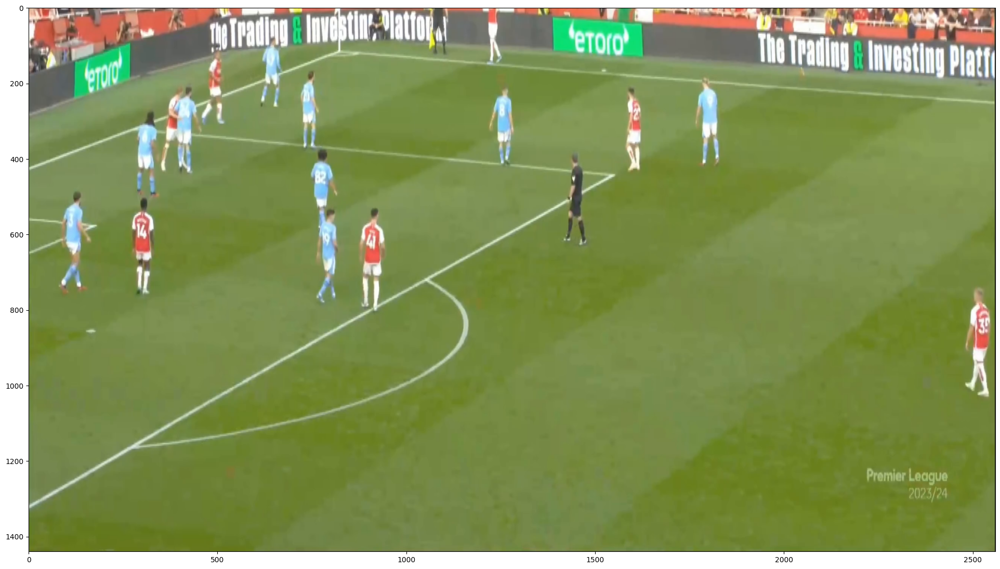

In [2]:
data_path = os.path.join(os.path.dirname(os.getcwd()), 'data')
vid_name = 'real_test'
images_path = os.path.join(data_path, 'images' + '/' + vid_name)

image_path = os.path.join(images_path, '000000000047.png')#sorted(os.listdir(images_path))[8])
rgb_image = cv2.imread(image_path, cv2.COLOR_BGR2RGB)

cropped_image = pitch_segment(rgb_image, visualize=False)
orig_h, orig_w, _ = cropped_image.shape

plt.figure()
plt.imshow(cropped_image[:, :, ::-1])

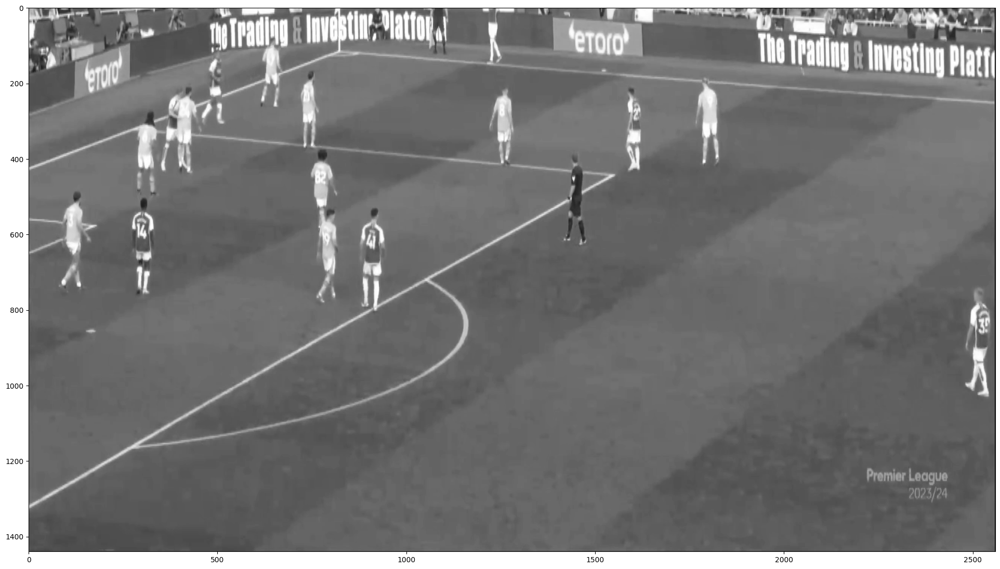

In [3]:
gray_image = cv2.cvtColor(cropped_image, cv2.COLOR_RGB2GRAY)
plt.figure()
plt.imshow(gray_image, cmap='gray')

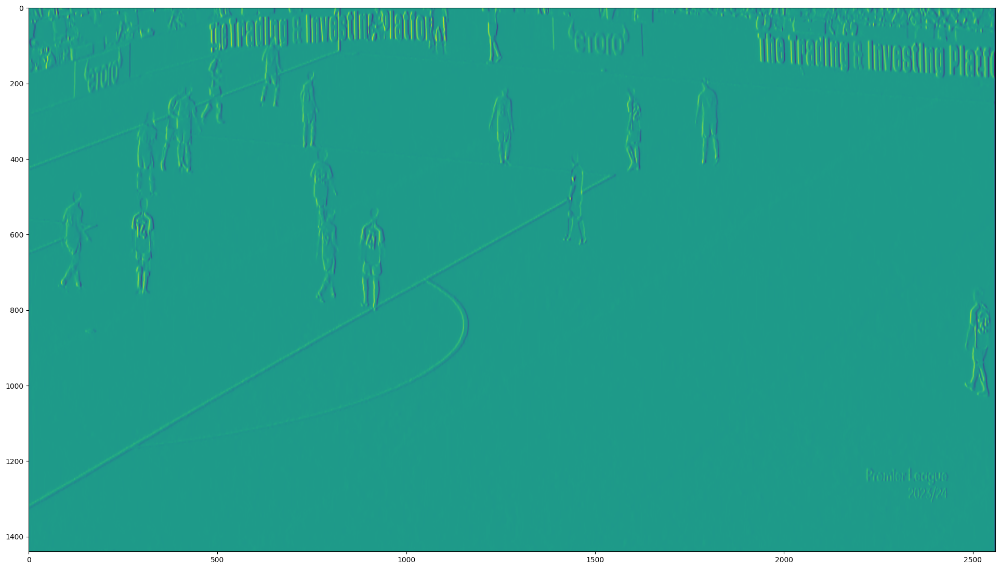

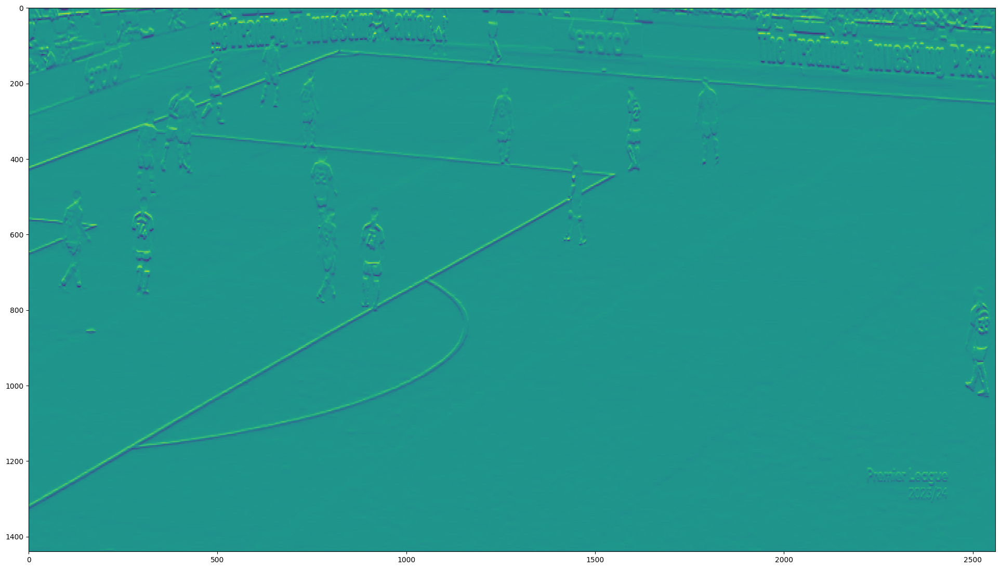

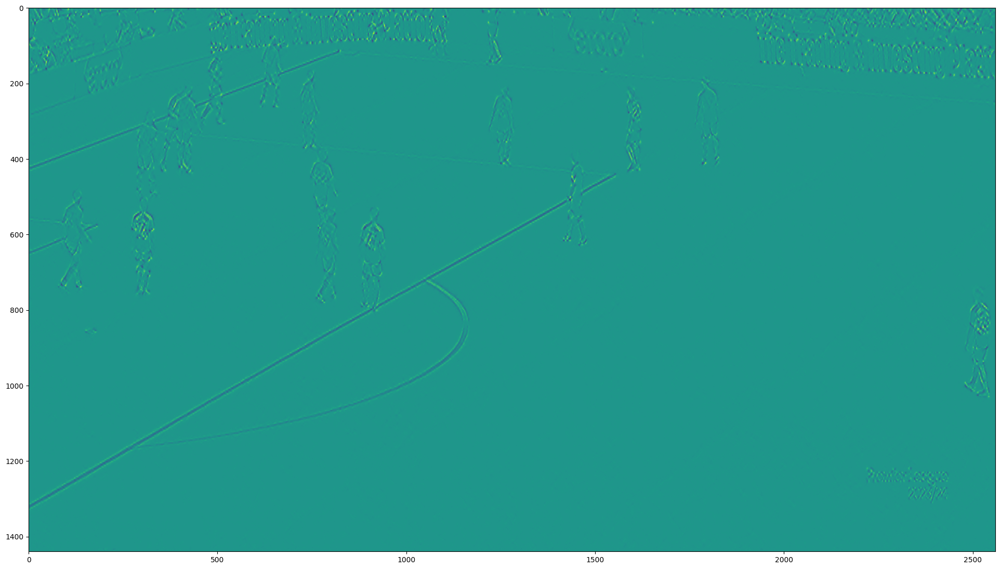

In [4]:
sobelx = cv2.Sobel(src=gray_image, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
plt.figure()
plt.imshow(sobelx)

sobely = cv2.Sobel(src=gray_image, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
plt.figure()
plt.imshow(sobely)

sobelxy = cv2.Sobel(src=gray_image, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=9) # Combined X and Y Sobel Edge Detection
plt.figure()
plt.imshow(sobelxy)

In [5]:
H_1l = np.array([[1, 2, 3, 4, 0, 0, 0],
                [2, 3, 4, 0, 0, 0, 0],
                [3, 4, 0, 0, 0, 0, 0],
                [4, 0, 0, 0, 0, 0, 0],
                [0, 0, 0, 0, 0,-4,-3],
                [0, 0, 0, 0,-4,-3,-2],
                [0, 0, 0,-4,-3,-2,-1]])
H_1r = H_1l.T

H_2l = np.array([[1, 2, 3, 4, 0, 0,-4],
                [1, 2, 3, 4, 0,-4,-3],
                [2, 3, 4, 0, 0,-4,-3],
                [2, 3, 4, 0,-4,-3,-2],
                [3, 4, 0, 0,-4,-3,-2],
                [3, 4, 0, 0,-3,-2,-1],
                [4, 0, 0,-4,-3,-2,-1]])

H_2r = H_1r.T

class:  ndarray
shape:  (1440, 2560)
strides:  (2560, 1)
itemsize:  1
aligned:  True
contiguous:  True
fortran:  False
data pointer: 0x1b44e0d0
byteorder:  little
byteswap:  False
type: uint8
None


array([  0,   4,   7,  11,  13,  14,  15,  16,  17,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,  70,  71,
        72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133,
       134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195,
       196, 197, 198, 199, 200, 201, 202, 203, 20

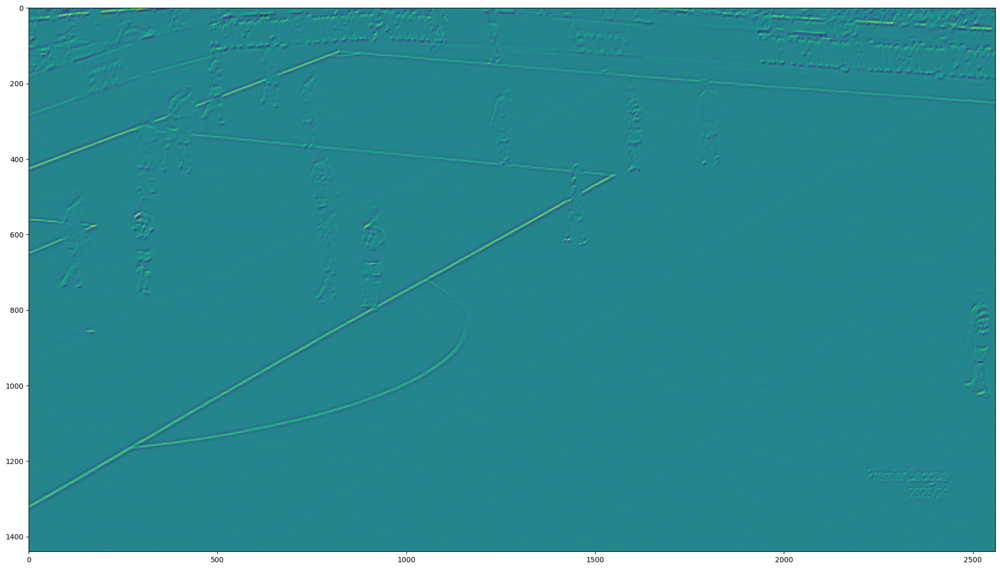

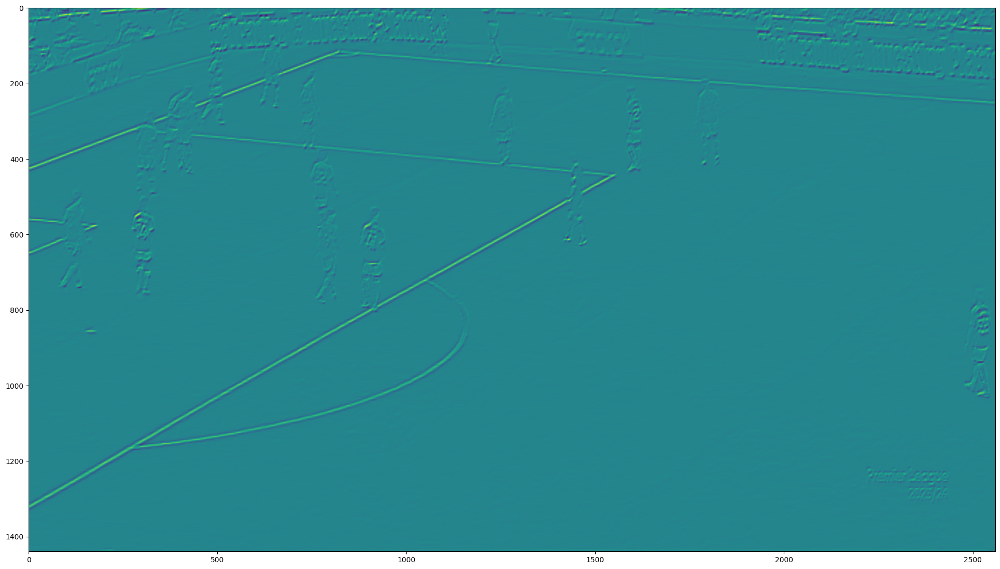

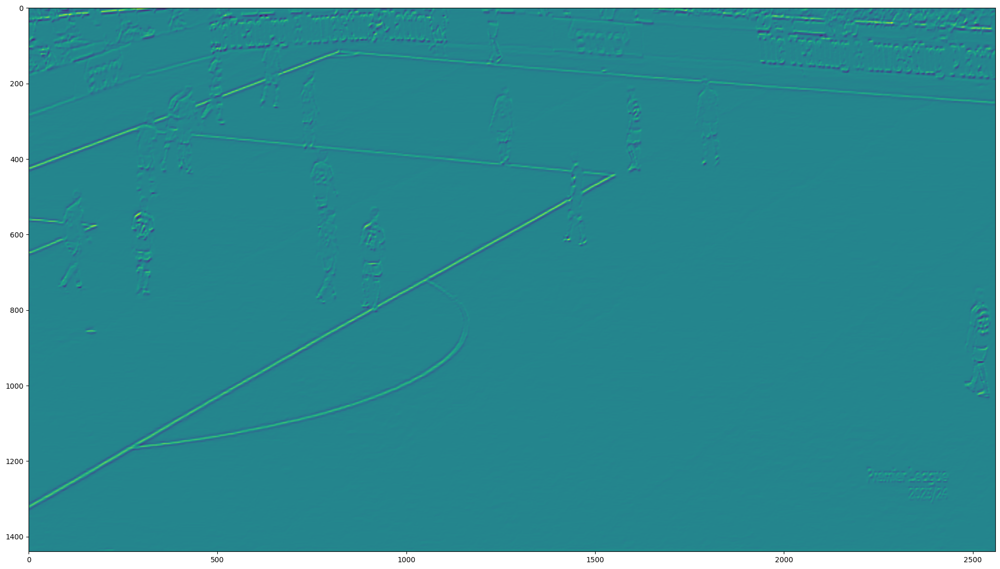

In [58]:
filter_field_image = cv2.filter2D(sobely, cv2.CV_64F, H_1l)
filter_field_image = cv2.filter2D(sobely, cv2.CV_64F, H_2l)
filter_field_image = cv2.filter2D(sobely, cv2.CV_64F, H_1r)
filter_field_image = cv2.filter2D(sobely, cv2.CV_64F, H_2r)
plt.figure()
plt.imshow(filter_field_image)
plt.figure()
plt.imshow(filter_field_image.astype(np.int32))

# Convert to int8?
norm_filter_field_image = cv2.normalize(filter_field_image,
            None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_64F).astype(np.int8)
norm_filter_field_image = cv2.normalize(filter_field_image,
            None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_8U)

plt.figure()
plt.imshow(norm_filter_field_image)
print(np.info(norm_filter_field_image))
np.unique(norm_filter_field_image)

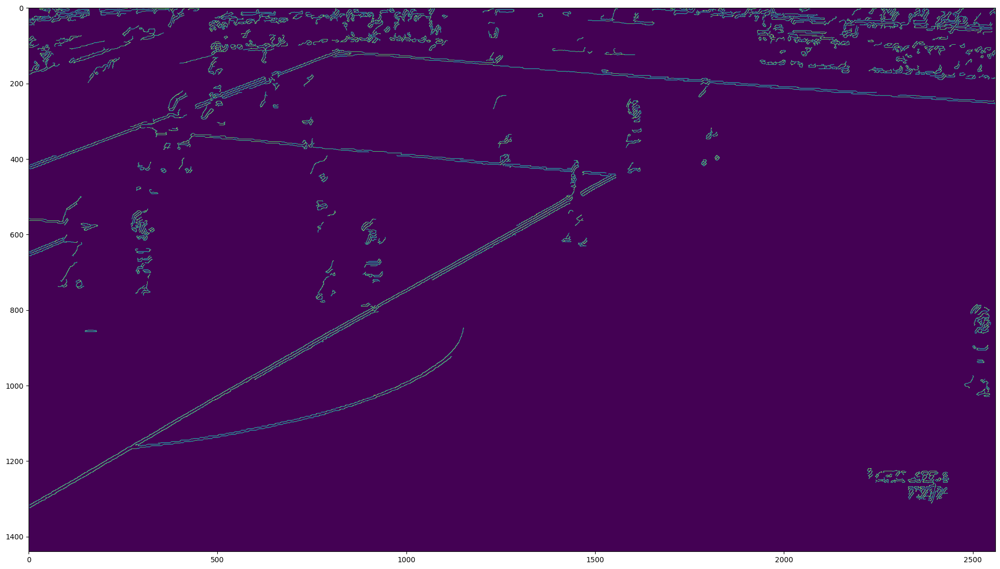

In [59]:
sigma = 0.5
v = np.median(norm_filter_field_image)
lower = int(max(0, (1.0 - sigma) * v)) - 20
upper = int(min(255, (1.0 + sigma) * v))


edges = cv2.Canny(norm_filter_field_image, lower, upper)
plt.figure()
plt.imshow(edges)

1809


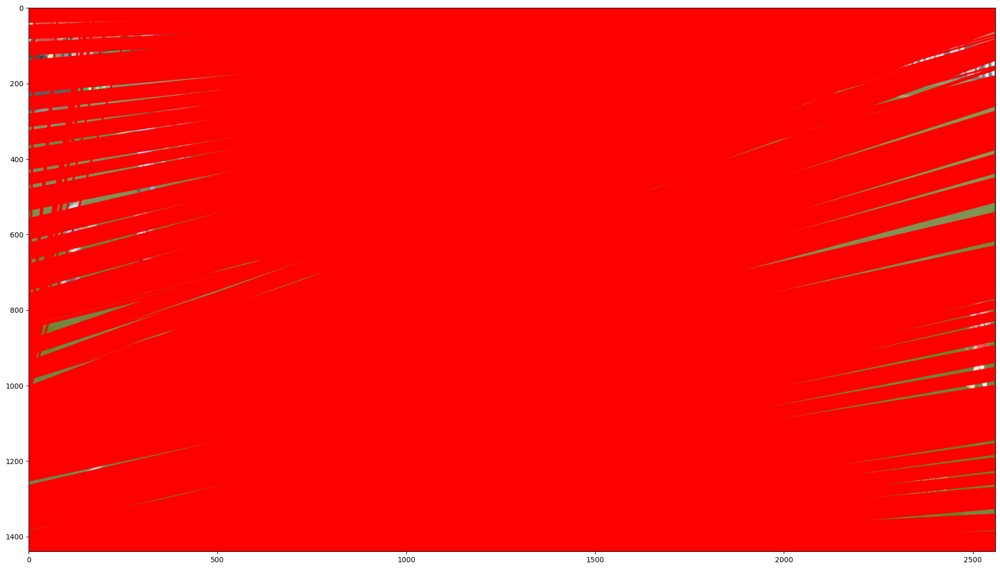

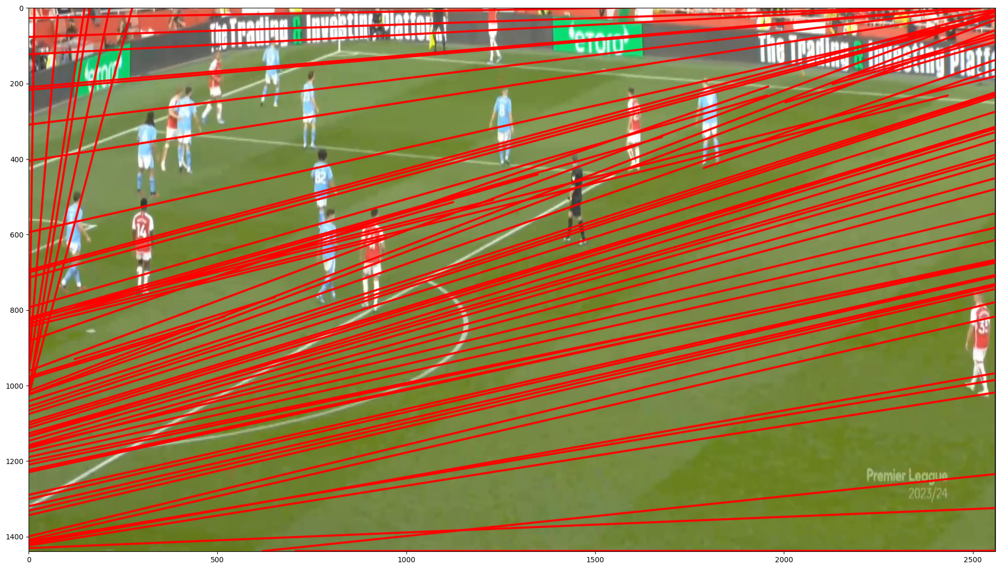

In [63]:
lines = cv2.HoughLinesP(norm_filter_field_image, 1, np.pi / 180, threshold=50, minLineLength=60, maxLineGap=20)
print(len(lines))
temp = cropped_image.copy()
if lines is not None:
    for line in lines:
        cv2.line(temp, (line[0][0], line[0][1]), (line[0][2], line[0][3]), (0,0,255), 3, cv2.LINE_AA)
plt.figure()
plt.imshow(temp[:,:,::-1])

bundler = HoughBundler(min_distance=5, min_angle=1)
lines = bundler.process_lines(sorted(lines, key=lambda x: x[0][0]))
temp = cropped_image.copy()
final_lines = []
if lines is not None:
    for line in lines:
        pt1, pt2 = np.array([line[0][0], line[0][1]]), np.array([line[0][2], line[0][3]])
        _, length = angle_and_distance(pt1, pt2)
        if length > 400:
            cv2.line(temp, pt1, pt2, (0, 0, 255), 4, cv2.LINE_AA)
            final_lines.append(line)

plt.figure()
plt.imshow(temp[:,:,::-1])

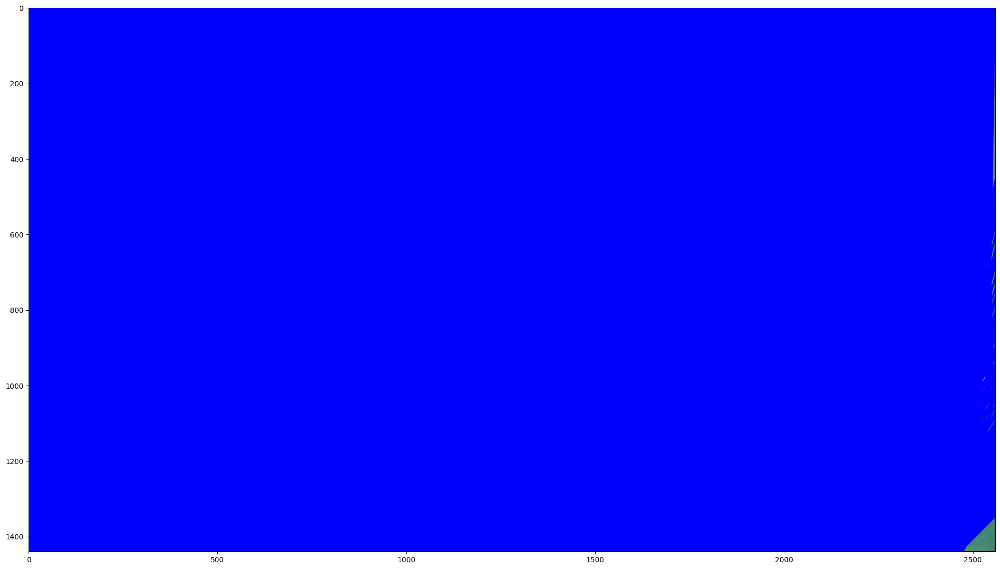

In [62]:
temp = cropped_image.copy()
lines = cv2.HoughLines(norm_filter_field_image, 1, np.pi / 180, 180)

if lines is not None:
    for i in range(0, len(lines)):
        rho = lines[i][0][0]
        theta = lines[i][0][1]
        a = math.cos(theta)
        b = math.sin(theta)
        x0 = a * rho
        y0 = b * rho
        pt1 = (int(x0 + 1000*(-b)), int(y0 + 1000*(a)))
        pt2 = (int(x0 - 1000*(-b)), int(y0 - 1000*(a)))
        cv2.line(temp, pt1, pt2, (0,0,255), 3, cv2.LINE_AA)
plt.imshow(temp)